# Gradients from climatology

Uses xgcm remapping functionality

In [1]:
%load_ext watermark

import cf_xarray
import dcpy
import distributed
import gsw
import hvplot.xarray

# import icecream as ic
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# import pump
import xgcm

import eddydiff as ed
import xarray as xr

xr.set_options(keep_attrs=True)

%watermark -iv

plt.rcParams["figure.dpi"] = 140
plt.rcParams["savefig.dpi"] = 200

import dask

dask.config.set(
    {
        "distributed.nanny.environ": {
            "MALLOC_TRIM_THRESHOLD_": 0,
            "OMP_NUM_THREADS": 1,
            "MKL_NUM_THREADS": 1,
        }
    }
)
dask.config.get("distributed.nanny.environ")

eddydiff   : 0.1
numpy      : 1.23.5
dcpy       : 0.2.1.dev11+gebbbf87.d20220428
xarray     : 2023.3.0
xgcm       : 0.8.1
cf_xarray  : 0.8.1.dev0+gce9cd5a.d20230327
matplotlib : 3.7.1
pandas     : 1.5.3
gsw        : 3.6.16
hvplot     : 0.8.3
distributed: 2023.3.2



{'MALLOC_TRIM_THRESHOLD_': 0, 'OMP_NUM_THREADS': 1, 'MKL_NUM_THREADS': 1}

In [2]:
client = distributed.Client(n_workers=2, threads_per_worker=2, memory_limit="4GB")
client

2023-04-21 13:49:58,543 - distributed.diskutils - INFO - Found stale lock file and directory '/var/folders/yp/rzgd0f7n5zbcbf5dg73sfb8ntv3xxm/T/dask-worker-space/worker-j74zauuu', purging
2023-04-21 13:49:58,545 - distributed.diskutils - INFO - Found stale lock file and directory '/var/folders/yp/rzgd0f7n5zbcbf5dg73sfb8ntv3xxm/T/dask-worker-space/worker-wywsiv65', purging


Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:8787/status,
Dashboard: http://127.0.0.1:8787/status,Workers: 2
Total threads: 4,Total memory: 7.45 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:59410,Workers: 2
Dashboard: http://127.0.0.1:8787/status,Total threads: 4
Started: Just now,Total memory: 7.45 GiB
Comm: tcp://127.0.0.1:59418,Total threads: 2
Dashboard: http://127.0.0.1:59419/status,Memory: 3.73 GiB
Nanny: tcp://127.0.0.1:59413,


## Cole et al 2015 method

1. Uses argo dataset 2005-2012 in the paper; provided dataset uses 2005-2015

1. Mean salinity profiles ${S}$ (Figure 1c) are constructed by smoothing the Roemmich and Gilson \[2009\] monthly mapped salinity field with a 1 year running average, then interpolating in space and time to the location and time of each Argo profile.

1. The salinity gradient for each year of observations is estimated as the average magnitude of the 3° forward and backward spatial differences:
\begin{equation}
∣ ∇_{x}  {S}∣ =  \frac 12 ∣ ∇_{x+} {S} ∣ + \frac 12 ∣ ∇_{x-} {S} ∣
\end{equation}. 

This is formally equivalent to a 6° centered difference for a planar salinity surface but does not underestimate the salinity gradient for symmetric salinity surfaces (for which a centered difference would result in zero gradient and an ill-conditioned mixing length). The salinity gradient is then averaged over all years. Near coastlines, forward or backward gradients are extrapolated using the nearest neighbor.

Q: ${S}$ is defined as monthly field interpolated to time and location of each Argo profile in (2). Is that what is used in (3)?

Notes on reproducing:

1. Definitely using Absolute Salinity (units are g/kg) and I can match "mean salinity" decently well.
1. Must be interpolating in depth to really high resolution because the output in σ space has pretty high resolution.
1. Big improvement when calculating gradients with monthly fields; then averaging to annual; then averaging across years

<xarray.Dataset>
Dimensions:                (pres: 101, lat: 131, lon: 360, sigma: 96)
Coordinates:
  * pres                   (pres) float64 0.0 20.0 40.0 ... 1.98e+03 2e+03
    start_year             float64 2.005e+03
    end_year               float64 2.015e+03
    mixing_efficiency      float64 0.16
    minimum_points         float64 15.0
    maximum_mixing_length  float64 6e+05
  * lon                    (lon) float64 1.5 2.5 3.5 4.5 ... 358.5 359.5 360.5
  * lat                    (lat) float64 -65.0 -64.0 -63.0 ... 63.0 64.0 65.0
  * sigma                  (sigma) float64 20.0 20.1 20.2 ... 29.3 29.4 29.5
Data variables: (12/16)
    mixing_length_sig      (lat, lon, sigma) float64 ...
    salinity_mean_sig      (lat, lon, sigma) float64 ...
    salinity_std_sig       (lat, lon, sigma) float64 ...
    salinity_gradient_sig  (lat, lon, sigma) float64 ...
    depth_mean_sig         (lat, lon, sigma) float64 ...
    number_points_sig      (lat, lon, sigma) float64 ...
    ...                     ...
    density_mean_depth     (lat, lon, pres) float64 ...
    number_points          (lat, lon, pres) float64 ...
    velocity_std           (lat, lon, pres) float64 ...
    diffusivity            (lat, lon, pres) float64 nan nan nan ... nan nan nan
    process_date           timedelta64[ns] ...
    diffusivity_first      (lat, lon) float64 nan nan nan nan ... nan nan nan
Attributes:
    title:    This dataset contains calculations related to the estimation of...

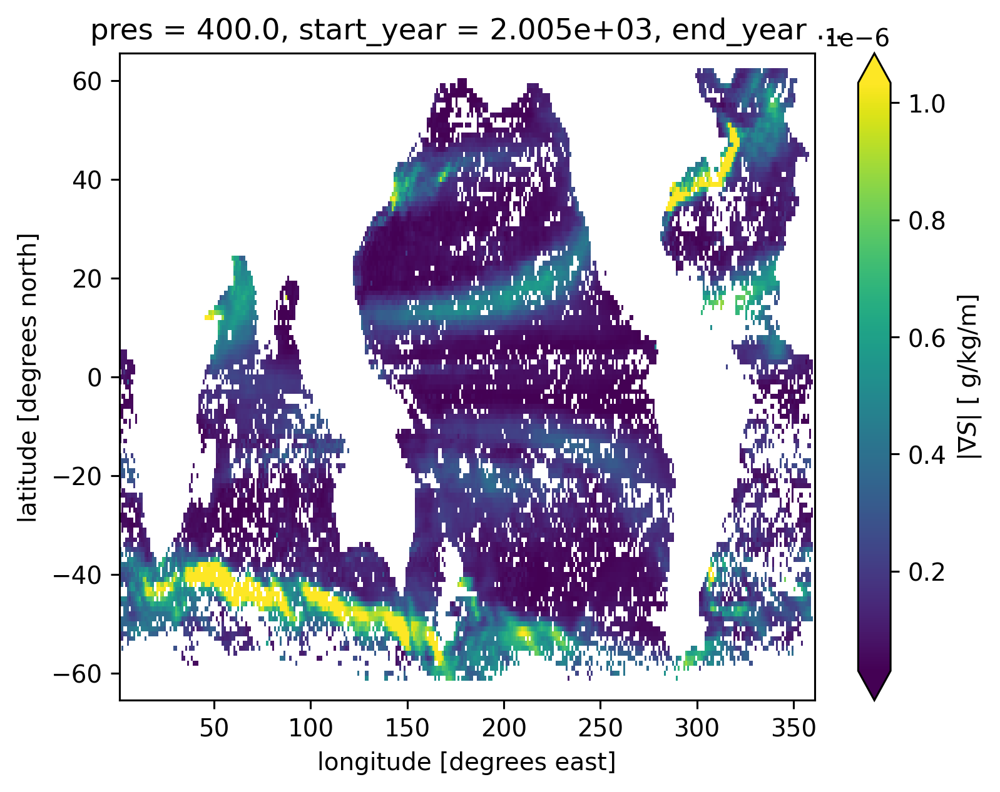

In [13]:
cole = ed.read_cole()
cole.salinity_gradient.isel(pres=20).plot(robust=True)
cole

### Argo climatology

In [10]:
argoclim = dcpy.oceans.read_argo_clim(
    chunks={"LATITUDE": 50, "LONGITUDE": 50, "TIME": 1, "PRES": -1}
)  # .sel(time=slice("2005", "2015"))
argomld = dcpy.oceans.argo_mld_clim()

lon = argomld.lon.data
lon[lon < 20] += 360
argomld, argoclim = xr.align(
    argomld.assign_coords(lon=lon).sortby("lon"), argoclim, join="inner"
)
argoclim["mld"] = argomld.mld_da_max.sel(month=argoclim.time.dt.month).chunk(
    {"lat": argoclim.chunks["lat"], "lon": argoclim.chunks["lon"]}
)

# argoclim["sigma"] = dcpy.eos.pden(argoclim.S, argoclim.T, argoclim.pres, 0) - 1000
argoclim["SA"] = gsw.SA_from_SP(argoclim.S, argoclim.pres, argoclim.lon, argoclim.lat)
argoclim["CT"] = gsw.CT_from_t(argoclim.SA, argoclim.T, argoclim.pres)
argoclim["sigma2"] = gsw.density.sigma2(argoclim.SA, argoclim.CT)
argoclim

<xarray.Dataset>
Dimensions:          (lat: 145, lon: 360, pres: 58, time: 180)
Coordinates:
  * lat              (lat) float64 -64.5 -63.5 -62.5 -61.5 ... 77.5 78.5 79.5
  * lon              (lon) float64 20.5 21.5 22.5 23.5 ... 377.5 378.5 379.5
  * pres             (pres) float32 2.5 10.0 20.0 ... 1.8e+03 1.9e+03 1.975e+03
  * time             (time) datetime64[ns] 2004-01-31 2004-02-29 ... 2018-12-31
    month            (time) float64 dask.array<chunksize=(180,), meta=np.ndarray>
Data variables: (12/13)
    Tmean            (pres, lat, lon) float32 dask.array<chunksize=(58, 50, 50), meta=np.ndarray>
    Tanom            (time, pres, lat, lon) float32 dask.array<chunksize=(1, 58, 50, 50), meta=np.ndarray>
    BATHYMETRY_MASK  (pres, lat, lon) float32 dask.array<chunksize=(58, 50, 50), meta=np.ndarray>
    MAPPING_MASK     (pres, lat, lon) float32 dask.array<chunksize=(58, 50, 50), meta=np.ndarray>
    T                (time, pres, lat, lon) float32 dask.array<chunksize=(1, 58, 50, 50), meta=np.ndarray>
    Smean            (pres, lat, lon) float32 dask.array<chunksize=(58, 50, 50), meta=np.ndarray>
    ...               ...
    S                (time, pres, lat, lon) float32 dask.array<chunksize=(1, 58, 50, 50), meta=np.ndarray>
    theta_mean       (pres, lat, lon) float32 dask.array<chunksize=(58, 50, 50), meta=np.ndarray>
    mld              (lat, lon, time) float64 dask.array<chunksize=(50, 50, 180), meta=np.ndarray>
    SA               (time, pres, lat, lon) float64 dask.array<chunksize=(1, 58, 50, 50), meta=np.ndarray>
    CT               (time, pres, lat, lon) float64 dask.array<chunksize=(1, 58, 50, 50), meta=np.ndarray>
    sigma2           (time, pres, lat, lon) float64 dask.array<chunksize=(1, 58, 50, 50), meta=np.ndarray>

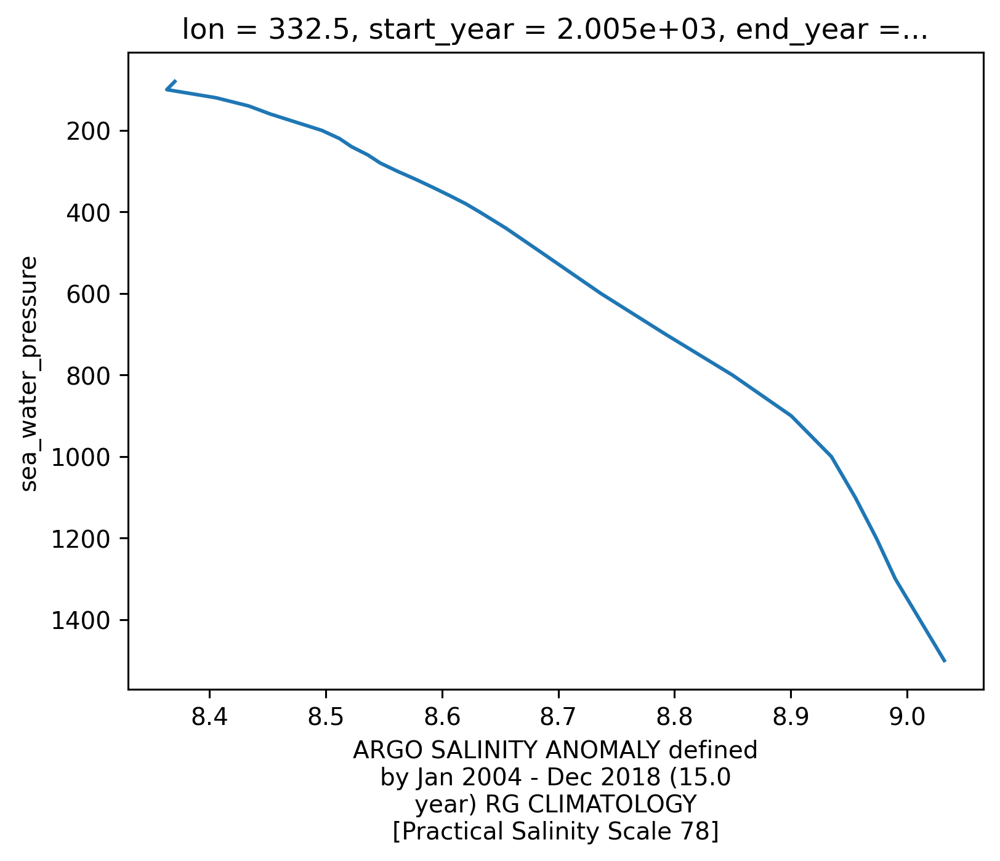

In [14]:
loc = dict(lon=360 - 28, lat=25, method="nearest")
(argoclim.sigma2.sel(**loc).mean("time") - cole.density_mean_depth.sel(**loc)).cf.plot()

In [15]:
from dcpy.interpolate import bin_to_new_coord

# fmt: off
# σ_2 bins
bins = np.array([34.147, 34.155, 34.166, 34.182, 34.217, 34.295, 34.401, 34.504,
       34.594, 34.666, 34.725, 34.773, 34.817, 34.858, 34.899, 34.939,
       34.978, 35.017, 35.056, 35.096, 35.136, 35.178, 35.221, 35.266,
       35.314, 35.366, 35.423, 35.485, 35.553, 35.628, 35.709, 35.798,
       35.894, 35.997, 36.105, 36.217, 36.33 , 36.44 , 36.547, 36.648,
       36.742, 36.828, 36.905, 36.971, 37.026, 37.072, 37.109, 37.138,
       37.16 , 37.175, 37.185, 37.19 , 37.193, 37.195, 37.196, 37.197,
       37.199, 37.2  , 37.201, 37.202], dtype=np.float32)
# fmt: on

newpres = xr.DataArray(np.arange(2.5, 2001, 2.5), dims="pres", name="pres")
clim_dens = bin_to_new_coord(
    argoclim[["CT", "SA", "sigma2"]]
    .set_coords("sigma2")
    .interp(pres=newpres)
    .where(newpres > argoclim.mld),
    "pres",
    "sigma2",
    edges=bins,
)


def calc_full_gradient_cole(ds):
    from eddydiff import gradient_cole

    Sgrad = np.hypot(gradient_cole(ds.SA, "lon"), gradient_cole(ds.SA, "lat"))
    Tgrad = np.hypot(gradient_cole(ds.CT, "lon"), gradient_cole(ds.CT, "lat"))
    Sgrad.attrs.update({"long_name": "$∇S$", "units": "g/kg/m"})
    Tgrad.attrs.update({"long_name": "$∇T$", "units": "°C/m"})
    # del Sgrad.attrs["standard_name"]
    # del Tgrad.attrs["standard_name"]

    return Sgrad, Tgrad


clim_dens["Sgrad"], clim_dens["Tgrad"] = calc_full_gradient_cole(clim_dens)
annual_dens = clim_dens.coarsen(time=12).mean()
annual_dens_mean = annual_dens.mean("time").set_coords("pres")
annual_dens_mean

<xarray.Dataset>
Dimensions:     (lat: 145, lon: 360, sigma2: 59)
Coordinates:
    pres        (lat, lon, sigma2) float64 dask.array<chunksize=(50, 50, 59), meta=np.ndarray>
  * lat         (lat) float64 -64.5 -63.5 -62.5 -61.5 ... 76.5 77.5 78.5 79.5
  * lon         (lon) float64 20.5 21.5 22.5 23.5 ... 376.5 377.5 378.5 379.5
  * sigma2      (sigma2) float32 34.15 34.16 34.17 34.2 ... 37.2 37.2 37.2 37.2
Data variables:
    CT          (lat, lon, sigma2) float64 dask.array<chunksize=(50, 50, 59), meta=np.ndarray>
    SA          (lat, lon, sigma2) float64 dask.array<chunksize=(50, 50, 59), meta=np.ndarray>
    count_CT    (lat, lon, sigma2) float64 dask.array<chunksize=(50, 50, 59), meta=np.ndarray>
    count_SA    (lat, lon, sigma2) float64 dask.array<chunksize=(50, 50, 59), meta=np.ndarray>
    count_pres  (lat, lon, sigma2) float64 dask.array<chunksize=(50, 50, 59), meta=np.ndarray>
    Sgrad       (lat, lon, sigma2) float64 dask.array<chunksize=(50, 50, 59), meta=np.ndarray>
    Tgrad       (lat, lon, sigma2) float64 dask.array<chunksize=(50, 50, 59), meta=np.ndarray>

In [ ]:
annual_dens_mean.load(scheduler=client).to_zarr(
    "../argo-cole-clim-gradients-2023-04-21.zarr", mode="w"
)

### Test against Cole dataset

In [ ]:
annual_dens_mean = xr.open_dataset("../datasets/cole-clim-gradients-2022-04-07.zarr")

In [ ]:
eqpac = (
    annual_dens_mean[["Sgrad", "SA"]].sel(lon=220, lat=-0.5, method="nearest").load()
)

In [ ]:
natre = (
    annual_dens_mean[["Sgrad", "SA"]].sel(lon=360 - 27, lat=27, method="nearest").load()
)

In [ ]:
natre_region = annual_dens_mean.sel(
    lon=slice(360 - 35, 360 - 20), lat=slice(20, 30)
).load()
natre_region.CT.attrs = {"standard_name": "conservative_temperature", "units": "C"}
natre_region.SA.attrs = {"standard_name": "absolute_salinity", "units": "g/kg"}
natre_region

In [ ]:
natre_region.rename({"Tgrad": "dTiso", "Sgrad": "dSiso"}).to_netcdf(
    "../datasets/cole-clim-gradient-natre.nc"
)

In [ ]:
def compare_to_cole(my_subset):
    kwargs = dict(lon=my_subset.lon.data, lat=my_subset.lat.data, method="nearest")
    # my_subset = annual_dens_mean.sel(**kwargs).load()
    cole_subset = cole.sel(**kwargs).load()

    f, ax = plt.subplots(2, 3, sharex="col", sharey="row", constrained_layout=True)

    my_subset.Sgrad.cf.plot(marker="x", y="sigma", ax=ax[0, 0])
    cole_subset.salinity_gradient_sig.cf.plot(marker="x", ax=ax[0, 0])

    my_subset.Sgrad.cf.plot(marker="x", ax=ax[1, 0], y="pres")
    cole_subset.salinity_gradient.cf.plot(marker="x", ax=ax[1, 0])

    my_subset.pres.plot(y="sigma", marker=".", ax=ax[0, 1])
    cole_subset.density_mean_depth.plot(marker="x", ax=ax[0, 1])

    my_subset.SA.plot(y="sigma", marker="x", ax=ax[0, 2])
    cole_subset.salinity_mean_sig.cf.plot(marker="x", ax=ax[0, 2])

    my_subset.SA.plot(y="pres", marker="x", ax=ax[1, 2])
    cole_subset.salinity_mean.cf.plot(y="pres", marker="x", ax=ax[1, 2])

    f.suptitle(str(kwargs))
    [aa.set_title("") for aa in ax.flat]

    f.set_size_inches((8, 5))

#### Eq

In [ ]:
compare_to_cole(eqpac)
plt.gca().set_ylim([1000, 0])

#### NATRE

In [ ]:
compare_to_cole(natre)

In [46]:
ρmean = dcpy.eos.pden(argoclim.Smean, argoclim.Tmean, 0).rename("ρmean")
ρmean

<xarray.DataArray 'ρmean' (pres: 58, lat: 145, lon: 360)>
dask.array<truediv, shape=(58, 145, 360), dtype=float64, chunksize=(58, 145, 360), chunktype=numpy.ndarray>
Coordinates:
  * lon                 (lon) float32 20.5 21.5 22.5 23.5 ... 377.5 378.5 379.5
  * lat                 (lat) float32 -64.5 -63.5 -62.5 -61.5 ... 77.5 78.5 79.5
  * pres                (pres) float32 2.5 10.0 20.0 ... 1.9e+03 1.975e+03
    reference_pressure  int64 0
Attributes:
    units:          kg/m3
    long_name:      ARGO TEMPERATURE MEAN Jan 2004 - Dec 2018 (15.0 year) RG ...
    standard_name:  sea_water_potential_density

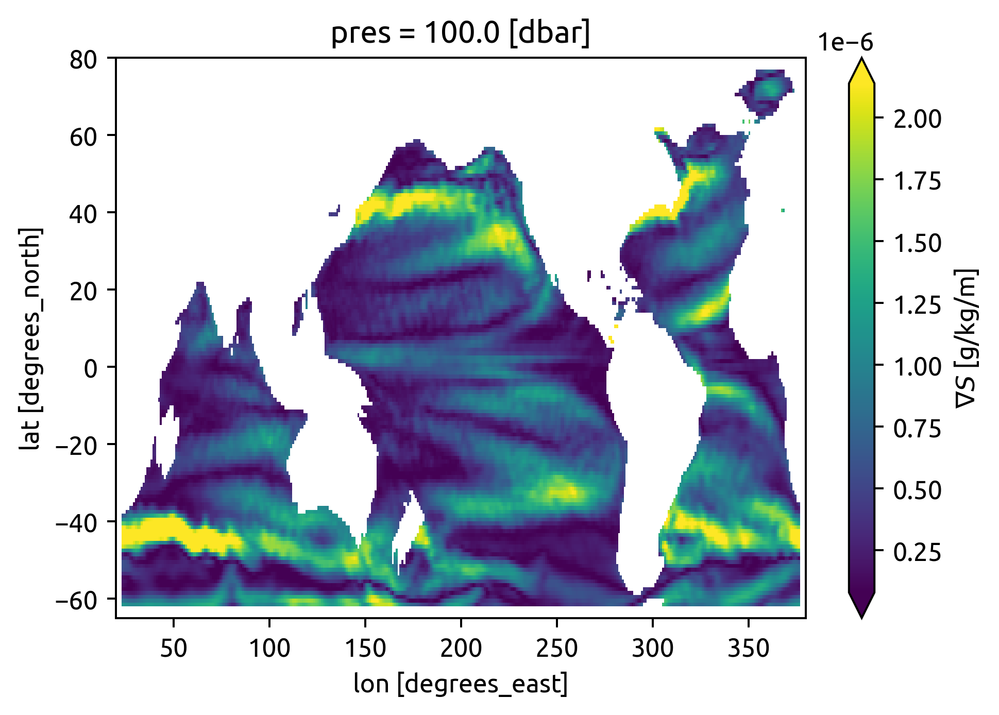

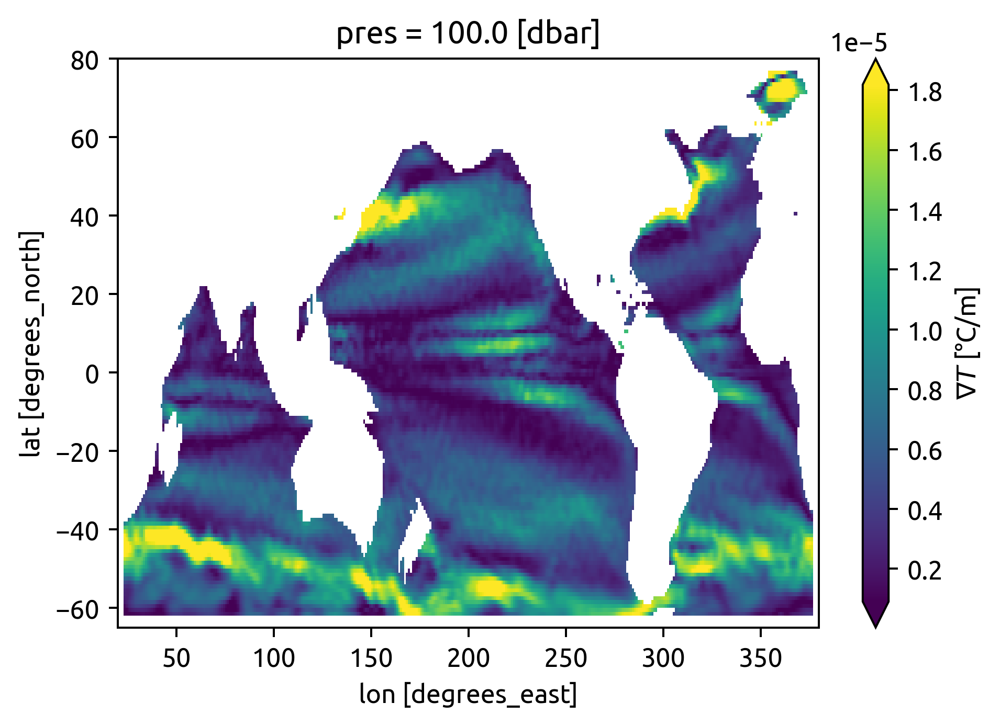

In [51]:
# sub.differentiate("lon").cf.plot(robust=True)
plt.figure()
Sgrad.isel(pres=10).cf.plot(robust=True)
plt.figure()
Tgrad.isel(pres=10).cf.plot(robust=True)

### Testing core gradient code

Checking my estimate by using Cole's mean salinity on sigma surfaces. This isn't useful because it doesn't replicate the procedure exactly

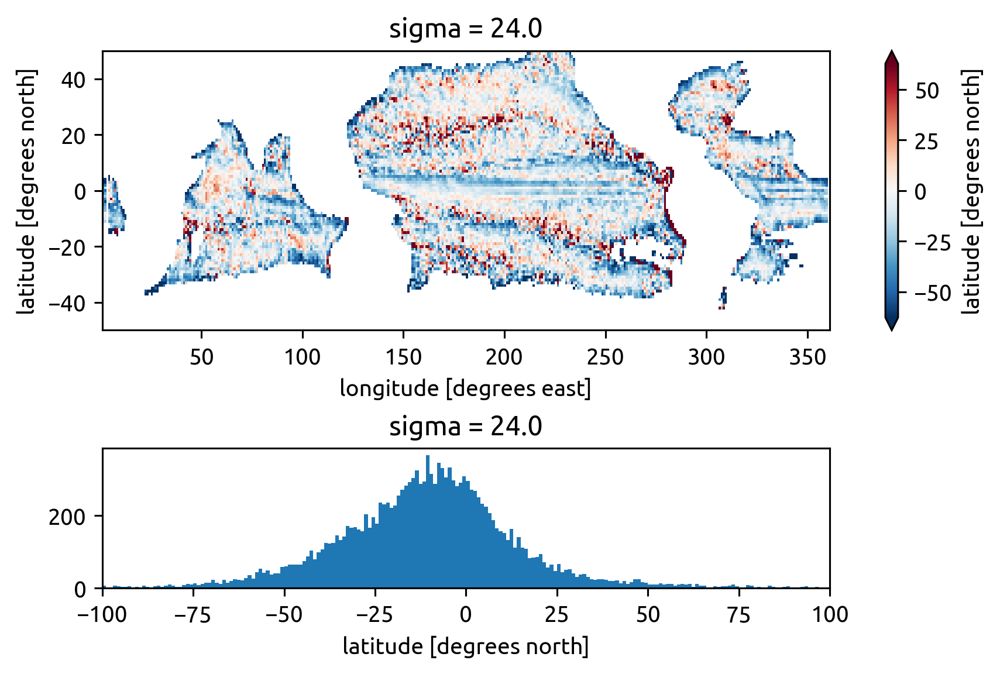

In [131]:
from eddydiff import gradient_cole

idx = 40

S = cole.salinity_mean_sig.isel(sigma=idx)
expected = cole.salinity_gradient_sig.isel(sigma=idx)
actual = np.hypot(gradient_cole(S, "lon", dxy=3), gradient_cole(S, "lat", dxy=3))
err = 100 * (actual - expected) / expected
actual.attrs = {}

f, ax = plt.subplots(
    2, 1, gridspec_kw={"height_ratios": [2, 1]}, constrained_layout=True
)
err.plot(robust=True, ax=ax[0], ylim=(-50, 50))
err.plot.hist(bins=np.arange(-100, 100, 1), ax=ax[1], xlim=(-100, 100));

Trying some idealized experiments

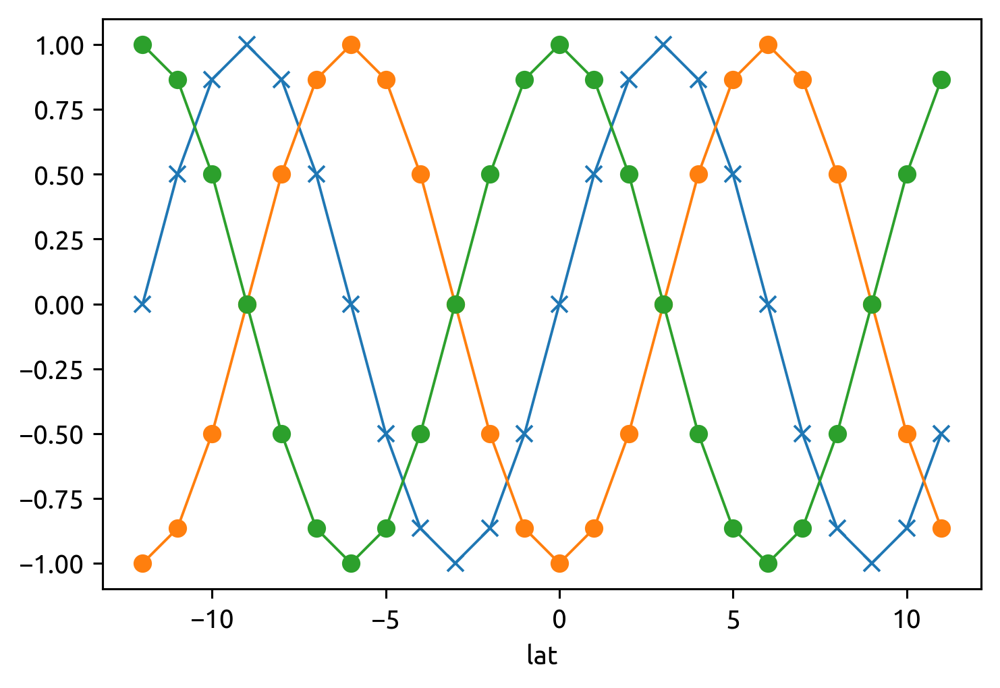

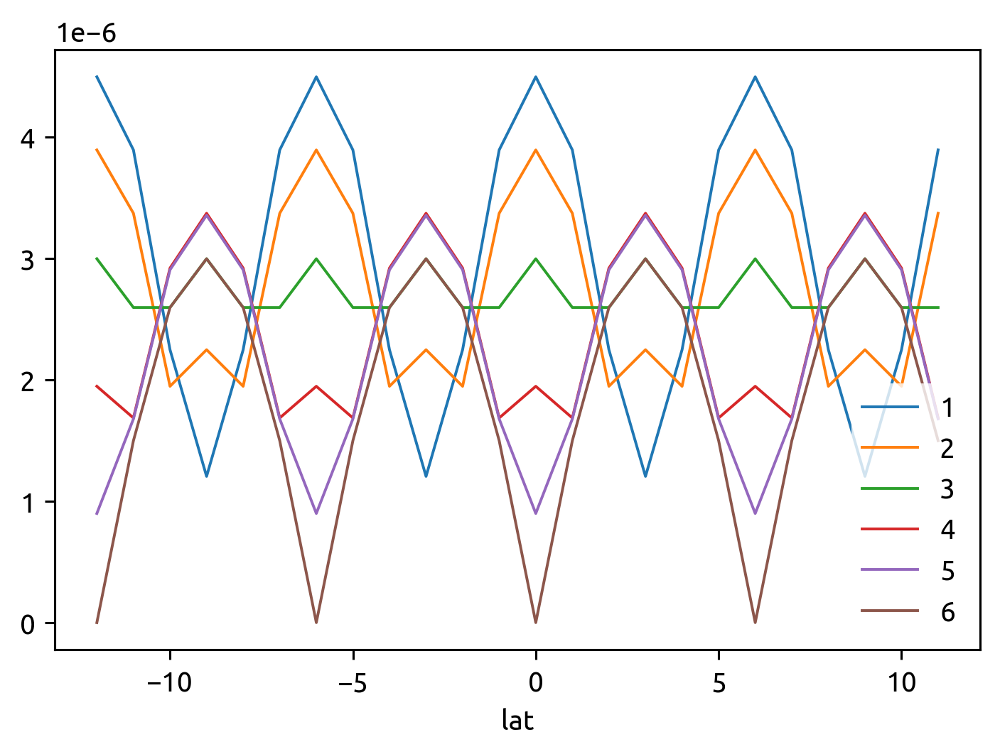

In [132]:
lat = np.arange(-12, 12, 1)
data = xr.DataArray(np.sin(2 * np.pi * lat / 12), dims="lat", coords={"lat": lat})
expected = data.copy(data=np.cos(2 * np.pi * lat / 12))

data.plot(marker="x")
data.roll({"lat": 3}).plot(marker="o")
data.roll({"lat": -3}).plot(marker="o")

plt.figure()
for dxy in [1, 2, 3, 4, 5, 6]:
    gradient_cole(data, "lat", dxy=dxy).plot(label=str(dxy))

plt.legend()
# (actual).plot()
# expected.plot()

## Older stuff

In [25]:
argograd = xr.open_zarr(
    "../datasets/argo_monthly_iso_gradients.zarr", decode_times=False
)
argograd = argograd.cf.guess_coord_axis()
argograd.pres.attrs["positive"] = "down"
argograd = argograd.cf.add_bounds("pres")
argo = (
    argograd.sel(lon=360 - 140, method="nearest")
    .sel(lat=slice(-3, 8), pres=slice(500))
    .mean("time")
)
argo["pden"] = ed.jmd95.dens(argo.Smean, argo.Tmean, 0)
argo

<xarray.Dataset>
Dimensions:      (bounds: 2, lat: 11, pres: 34)
Coordinates:
  * lat          (lat) float32 -2.5 -1.5 -0.5 0.5 1.5 2.5 3.5 4.5 5.5 6.5 7.5
    lon          float32 220.5
  * pres         (pres) float64 2.5 10.0 20.0 30.0 ... 420.0 440.0 462.5 500.0
    pres_bounds  (bounds, pres) float32 -1.25 6.25 15.0 ... 450.0 473.8 518.8
Dimensions without coordinates: bounds
Data variables:
    Smean        (pres, lat) float32 dask.array<chunksize=(34, 11), meta=np.ndarray>
    Tmean        (pres, lat) float32 dask.array<chunksize=(34, 11), meta=np.ndarray>
    dSdia        (pres, lat) float64 dask.array<chunksize=(34, 11), meta=np.ndarray>
    dSdz         (pres, lat) float32 dask.array<chunksize=(34, 11), meta=np.ndarray>
    dSiso        (pres, lat) float64 dask.array<chunksize=(34, 11), meta=np.ndarray>
    dTdia        (pres, lat) float64 dask.array<chunksize=(34, 11), meta=np.ndarray>
    dTdz         (pres, lat) float32 dask.array<chunksize=(34, 11), meta=np.ndarray>
    dTiso        (pres, lat) float64 dask.array<chunksize=(34, 11), meta=np.ndarray>
    ρmean        (pres, lat) float32 dask.array<chunksize=(34, 11), meta=np.ndarray>
    pden         (pres, lat) float32 dask.array<chunksize=(34, 11), meta=np.ndarray>
Attributes:
    dataset:  argo
    name:     Mean fields and isopycnal, diapycnal gradients from Argo

In [16]:
eccograd = ed.eddydiff.read_ecco_clim()

ecco = (
    eccograd.sel(lon=360 - 140, method="nearest")
    .sel(lat=slice(-3, 8), pres=slice(500))
    .mean("time")
)
ecco["pden"] = ed.jmd95.dens(ecco.Smean, ecco.Tmean, 0)
ecco

<xarray.Dataset>
Dimensions:      (bounds: 2, lat: 22, pres: 23)
Coordinates:
  * lat          (lat) float64 -2.75 -2.25 -1.75 -1.25 ... 6.25 6.75 7.25 7.75
    lon          float64 220.2
  * pres         (pres) float64 5.0 15.0 25.0 35.0 ... 299.9 350.7 409.9 477.5
    pres_bounds  (bounds, pres) float64 0.0 10.0 20.0 30.0 ... 376.1 439.6 511.2
Dimensions without coordinates: bounds
Data variables:
    RHOAnoma     (pres, lat) float64 dask.array<chunksize=(23, 6), meta=np.ndarray>
    Smean        (pres, lat) float64 dask.array<chunksize=(23, 6), meta=np.ndarray>
    Tmean        (pres, lat) float64 dask.array<chunksize=(23, 6), meta=np.ndarray>
    dSdia        (pres, lat) float64 dask.array<chunksize=(23, 6), meta=np.ndarray>
    dSdz         (pres, lat) float64 dask.array<chunksize=(23, 6), meta=np.ndarray>
    dSiso        (pres, lat) float64 dask.array<chunksize=(23, 6), meta=np.ndarray>
    dTdia        (pres, lat) float64 dask.array<chunksize=(23, 6), meta=np.ndarray>
    dTdz         (pres, lat) float64 dask.array<chunksize=(23, 6), meta=np.ndarray>
    dTiso        (pres, lat) float64 dask.array<chunksize=(23, 6), meta=np.ndarray>
    pden         (pres, lat) float64 dask.array<chunksize=(23, 6), meta=np.ndarray>
Attributes:
    dataset:  ecco
    name:     Mean fields and isopycnal, diapycnal gradients from ECCO v4r3

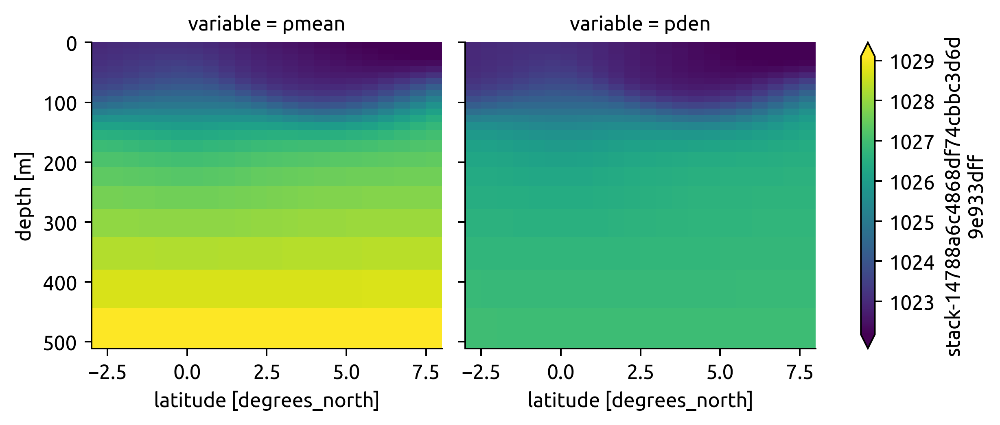

In [8]:
(
    ecco[["ρmean", "pden"]]
    # .sel(lon=220, method="nearest")
    .to_array().cf.plot(col="variable", y="vertical", robust=True)
)

______________________________________________________________________

## Estimate gradients

In [14]:
bins = np.array([1023.2, 1023.5, 1024, 1025, 1026])
centers = (bins[1:] + bins[:-1]) / 2
ic.ic(bins, centers)

ic| bins: array([1023.2, 1023.5, 1024. , 1025. , 1026. ])
    centers: array([1023.35, 1023.75, 1024.5 , 1025.5 ])


(array([1023.2, 1023.5, 1024. , 1025. , 1026. ]),
 array([1023.35, 1023.75, 1024.5 , 1025.5 ]))

/home/deepak/work/python/dcpy/dcpy/plots.py:1006: MatplotlibDeprecationWarning: 
The ax attribute was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
  ax = cs.ax


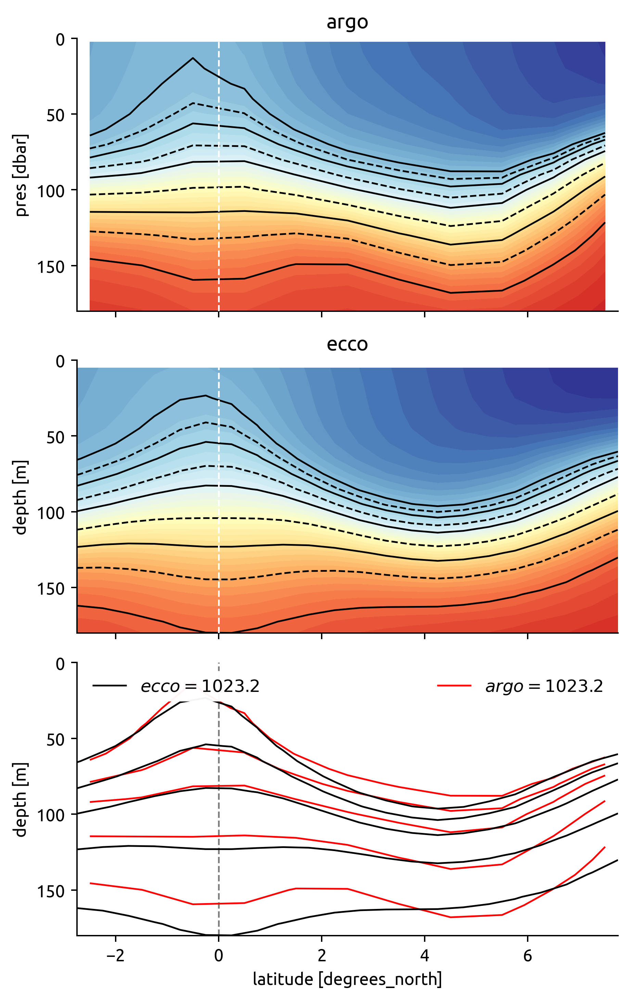

In [15]:
ed.plot.check_bins_with_climatology(bins, argo, ecco)

The magnitudes of ∂T/∂y seem to agree to within a factor of 2. Though the latitudinal profile of these gradients looks quite different (argo vs ecco)

The spline fits to the Argo data seems a little "stiff". Maybe I need to play with some parameters

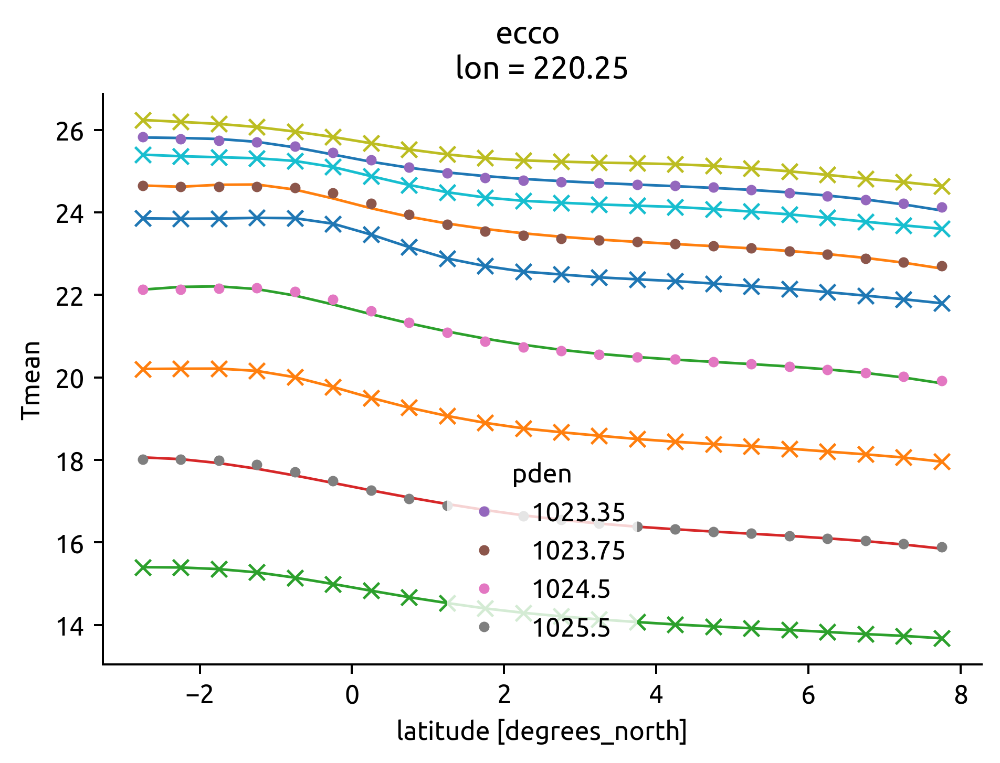

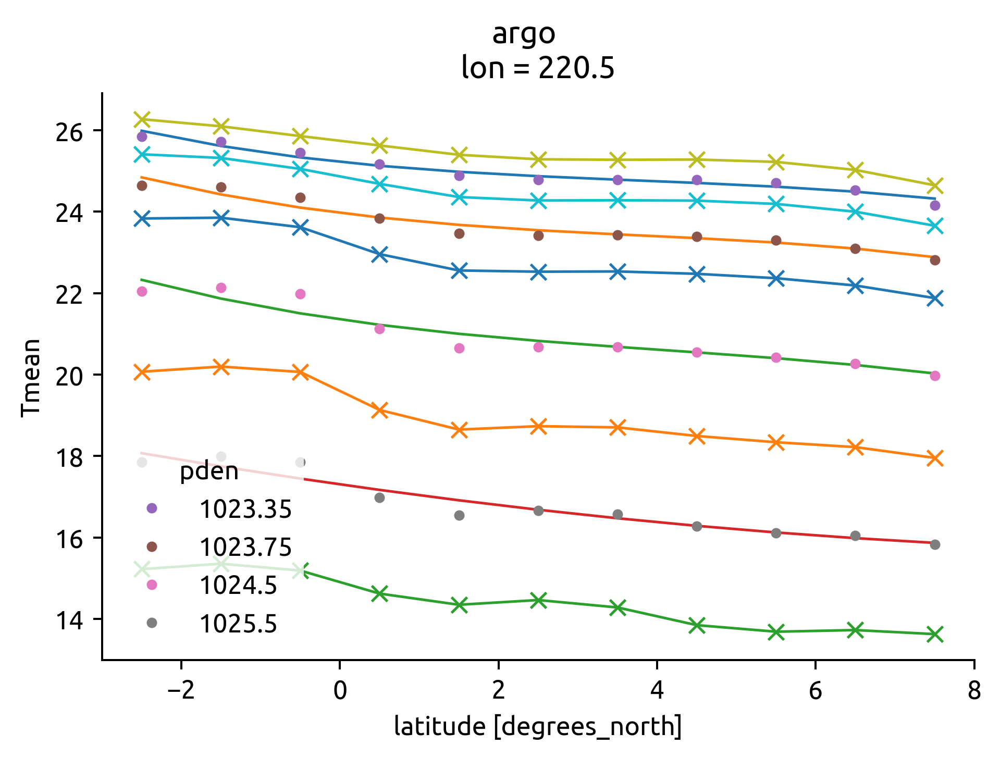

In [39]:
eccoT, edge = ed.eddydiff.estimate_gradients(ecco, bins, debug=True)
argoT, edge = ed.eddydiff.estimate_gradients(argo, bins, debug=True)

______________________________________________________________________

### Compare horizontal gradient

<Figure size 1080x720 with 0 Axes>

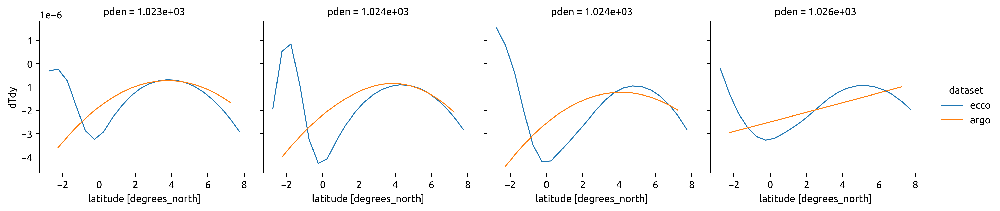

In [40]:
plt.figure()
xr.concat([eccoT.dTdy, argoT.dTdy.interp(lat=eccoT.lat)], dim=["ecco", "argo"]).rename(
    {"concat_dim": "dataset"}
).plot.line(x="lat", col="pden", hue="dataset")

______________________________________________________________________

### Compare vertical gradient

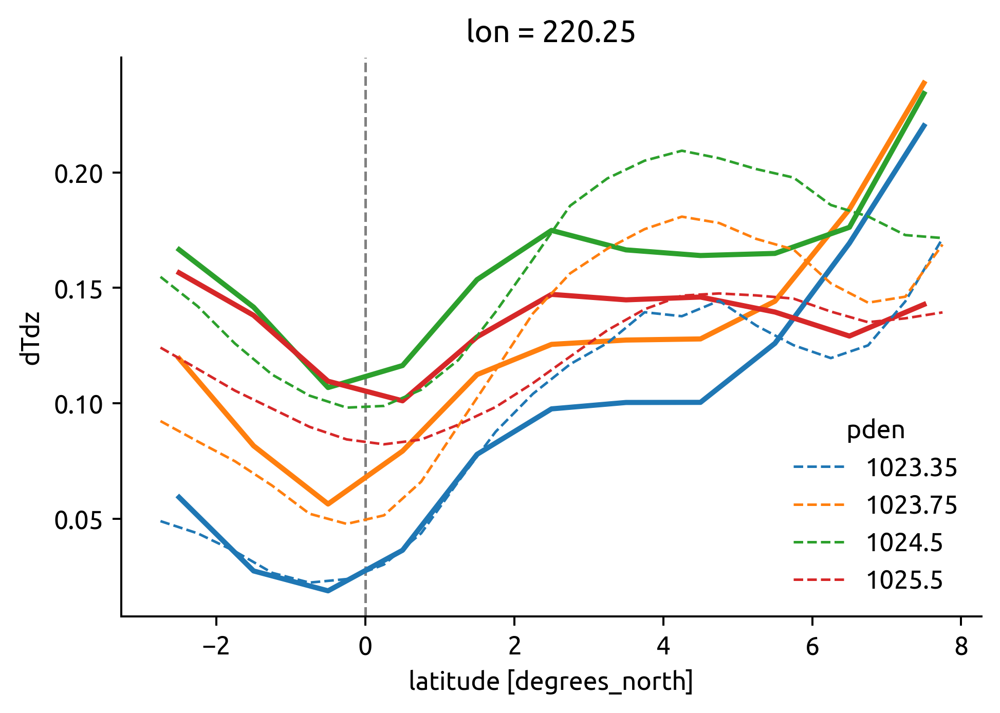

In [41]:
plt.rcParams["figure.dpi"] = 180

from cycler import cycler

cycle = plt.rcParams["axes.prop_cycle"]
with plt.rc_context({"axes.prop_cycle": cycler(color=cycle[:4])}):
    argoT.dTdz.plot.line(x="lat", lw=2)
    eccoT.dTdz.plot.line(x="lat", ls="--")
    dcpy.plots.linex(0)

### debugging plots

In [11]:
ed.fit_spline(isoT.lat, isoT.Tmean.isel(ρmean_bins=10).values, debug=True)

NameError: name 'isoT' is not defined

In [ ]:
eccograd.Tmean.sel(lon=slice(200, 240), lat=slice(-10, 10), pres=slice(150)).sel(
    lon=220, lat=0, method="nearest"
).plot(x="time", ylim=(200, 0), robust=True)
eccograd.ρmean.sel(lon=slice(200, 240), lat=slice(-10, 10), pres=slice(150)).sel(
    lon=220, lat=0, method="nearest"
).plot.contour(levels=11, x="time", ylim=(200, 0), robust=True)

In [ ]:
eccograd.dTdz.sel(lat=slice(-10, 10), lon=slice(200, 240)).sel(
    pres=100, method="nearest"
).isel(time=0).plot()

In [ ]:
eccograd.dTiso.sel(lat=slice(-10, 10), lon=slice(200, 240)).sel(
    pres=100, method="nearest"
).isel(time=0).plot()